In [3]:
# Must be installed the first time you run this code
!pip install scikit-learn

!pip install xgboost

!pip install pandas

!pip install numpy

!pip install seaborn

!pip install matplotlib

!pip install plotly
!pip install hdbscan
!pip install kneed

In [4]:
!pip install yellowbrick

In [39]:
# Importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
# from google.colab import drive
# from google.colab import files

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from sklearn.metrics import pairwise_distances

from kneed import KneeLocator
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage
import hdbscan

In [41]:
import pandas as pd
import statsmodels.api as sm
# from google.colab import drive
# from google.colab import files

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV

In [43]:
# Load an CSV file
file_path = 'movies.csv'
data = pd.read_csv(file_path)

data.head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,genres,production_companies,production_countries,spoken_languages,keywords,directors,writers,averageRating,numVotes,cast
0,27205,Inception,8.364,34495,Released,7/15/10,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, franc...",Christopher Nolan,Christopher Nolan,8.8,2620845,"Leonardo DiCaprio, Joseph Gordon-Levitt, Ken W..."
1,157336,Interstellar,8.417,32571,Released,11/5/14,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time,...",Christopher Nolan,"Jonathan Nolan, Christopher Nolan",8.7,2213594,"Matthew McConaughey, Anne Hathaway, Michael Ca..."
2,155,The Dark Knight,8.512,30619,Released,7/16/08,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,...,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime f...",Christopher Nolan,"Jonathan Nolan, Christopher Nolan, David S. Go...",9.0,2953309,"Christian Bale, Heath Ledger, Aaron Eckhart, M..."
3,19995,Avatar,7.573,29815,Released,12/15/09,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,...,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, ...",James Cameron,James Cameron,7.9,1410851,"Sam Worthington, Zoe Saldaña, Sigourney Weaver..."
4,24428,The Avengers,7.710,29166,Released,4/25/12,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,...,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian","new york city, superhero, shield, based on com...",Joss Whedon,"Joss Whedon, Zak Penn",8.0,1485386,"Robert Downey Jr., Chris Evans, Mark Ruffalo, ..."


In [44]:
file_path = 'movies-trimmed.csv'
data_trimmed = pd.read_csv(file_path)

data_trimmed.head()

,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,backdrop_path,...,genres,production_companies,production_countries,spoken_languages,keywords,directors,writers,averageRating,numVotes,cast
0,27205,Inception,8.364,34495,Released,2010-07-15,825532764,148,False,/8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg,...,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pict...","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, franc...",Christopher Nolan,Christopher Nolan,8.8,2620845,"Leonardo DiCaprio, Joseph Gordon-Levitt, Ken W..."
1,157336,Interstellar,8.417,32571,Released,2014-11-05,701729206,169,False,/pbrkL804c8yAv3zBZR4QPEafpAR.jpg,...,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Produc...","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time,...",Christopher Nolan,"Jonathan Nolan, Christopher Nolan",8.7,2213594,"Matthew McConaughey, Anne Hathaway, Michael Ca..."
2,155,The Dark Knight,8.512,30619,Released,2008-07-16,1004558444,152,False,/nMKdUUepR0i5zn0y1T4CsSB5chy.jpg,...,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel...","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime f...",Christopher Nolan,"Jonathan Nolan, Christopher Nolan, David S. Go...",9.0,2953309,"Christian Bale, Heath Ledger, Aaron Eckhart, M..."
3,19995,Avatar,7.573,29815,Released,2009-12-15,2923706026,162,False,/vL5LR6WdxWPjLPFRLe133jXWsh5.jpg,...,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, ...","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, ...",James Cameron,James Cameron,7.9,1410851,"Sam Worthington, Zoe Saldaña, Sigourney Weaver..."
4,24428,The Avengers,7.710,29166,Released,2012-04-25,1518815515,143,False,/9BBTo63ANSmhC4e6r62OJFuK2GL.jpg,...,"Science Fiction, Action, Adventure",Marvel Studios,United States of America,"English, Hindi, Russian","new york city, superhero, shield, based on com...",Joss Whedon,"Joss Whedon, Zak Penn",8.0,1485386,"Robert Downey Jr., Chris Evans, Mark Ruffalo, ..."


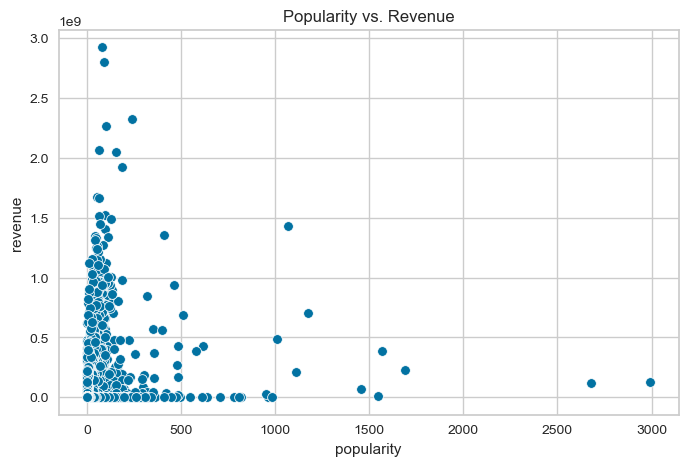

In [9]:
# We can look for popularity vs revenue
plt.figure(figsize=(8, 5))
sns.scatterplot(data=data, x='popularity', y='revenue')
plt.title("Popularity vs. Revenue")
plt.show()

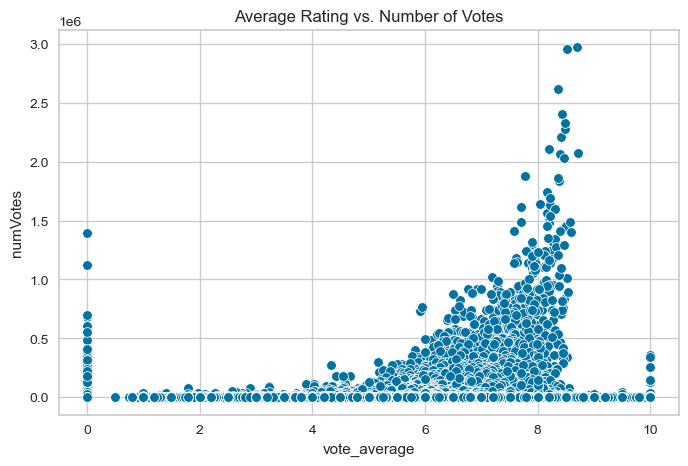

In [11]:
# We can look for average votes vs number of votes
plt.figure(figsize=(8, 5))
sns.scatterplot(data=data, x='vote_average', y='numVotes')
plt.title("Average Rating vs. Number of Votes")
plt.show()

In [47]:
from sklearn.feature_extraction.text import TfidfVectorizer

data_trimmed = data

# Fill missing values in the `keywords` column
data_trimmed['keywords'] = data_trimmed['keywords'].fillna('')

# Vectorize the `keywords` column using TF-IDF
vectorizer = TfidfVectorizer(max_features=100)  # Adjust max_features for dimensionality
keywords_matrix = vectorizer.fit_transform(data_trimmed['keywords'])

# Convert to DataFrame for easier manipulation
keywords_df = pd.DataFrame(keywords_matrix.toarray(), columns=vectorizer.get_feature_names_out())


In [49]:
# Add the `popularity` column to the keyword vectors
keywords_df['popularity'] = data['popularity']

In [51]:
# Calculate correlations between each keyword and popularity
correlations = keywords_df.corr()['popularity'].sort_values(ascending=False)
print(correlations.head(10))  # Top 10 most correlated keywords


popularity      1.000000
based           0.097634
on              0.094671
sequel          0.080909
novel           0.059747
or              0.051749
book            0.051162
relationship    0.049008
of              0.044488
city            0.040801
Name: popularity, dtype: float64


In [19]:
from sklearn.cluster import KMeans

# Perform clustering on keywords + popularity
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust n_clusters as needed
clusters = kmeans.fit_predict(keywords_df)

# Add cluster labels to the original dataset
data_trimmed['cluster'] = clusters

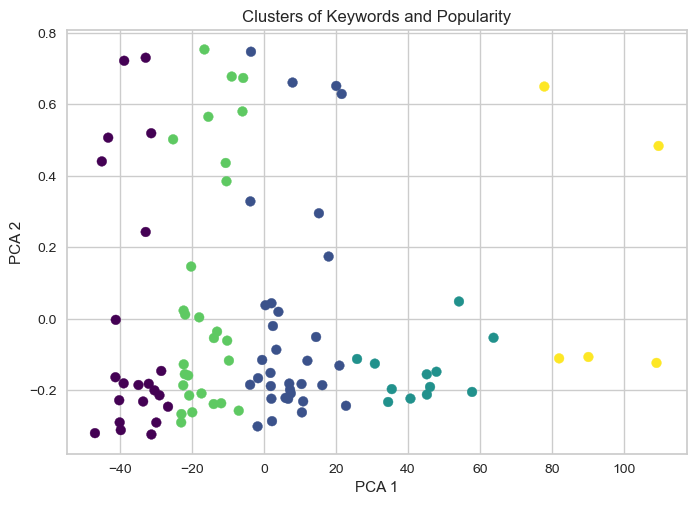

In [21]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(keywords_df)

# Plot clusters
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=clusters, cmap='viridis')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Clusters of Keywords and Popularity')
plt.show()

# ANALYZING DIRECTORS VS RATINGS



In [24]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

data_trimmed = data[:250000]

# Option 1: Label Encoding
label_encoder = LabelEncoder()
data_trimmed['directors_encoded'] = label_encoder.fit_transform(data_trimmed['directors'])

# Option 2: One-Hot Encoding
one_hot = pd.get_dummies(data_trimmed['directors'], prefix='director')
data_trimmed = pd.concat([data_trimmed, one_hot], axis=1)


/var/folders/tr/sh799zpx75ggxq0xkwpr3c8w0000gn/T/ipykernel_57108/3916219771.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed['directors_encoded'] = label_encoder.fit_transform(data_trimmed['directors'])


In [26]:
# Group by 'directors' and calculate the mean, median, std, and count of ratings
director_stats = data_trimmed.groupby('directors')['averageRating'].agg(['mean', 'median', 'std', 'count'])

# Filter out directors with fewer than 5 credits [to only include more established directors]
director_stats = director_stats[director_stats['count'] > 5]

# Sort by the mean rating in descending order
director_stats = director_stats.sort_values(by='mean', ascending=False)

# Display the top 10 directors
print(director_stats.head(10))


                                     mean  median       std  count
directors                                                         
Chris Zarb                       9.352941    9.40  0.488771     17
Javier Cruz Jr.                  9.063636    9.00  0.527774     11
Ross Hallard, Phil Michael Lane  9.042857    9.00  0.373529      7
John D. Boswell                  8.742857    8.60  0.364496      7
Alessio Di Zio                   8.700000    8.65  0.400000      8
Dmitri Frolov                    8.656410    8.70  0.666410     39
Anand Patwardhan                 8.516667    8.55  0.318852      6
Humphrey Burton                  8.516667    8.60  0.240139      6
Ville Lipiäinen                  8.483333    8.70  0.633772      6
Dick Carruthers                  8.476000    8.60  0.514198     25


In [28]:
# SKipping approach B

In [30]:
from sklearn.cluster import KMeans

# Use encoded directors and averageRating for clustering
director_matrix = data_trimmed[['directors_encoded', 'averageRating']]
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(director_matrix)

# Add cluster labels to the dataset
data_trimmed['director_cluster'] = clusters


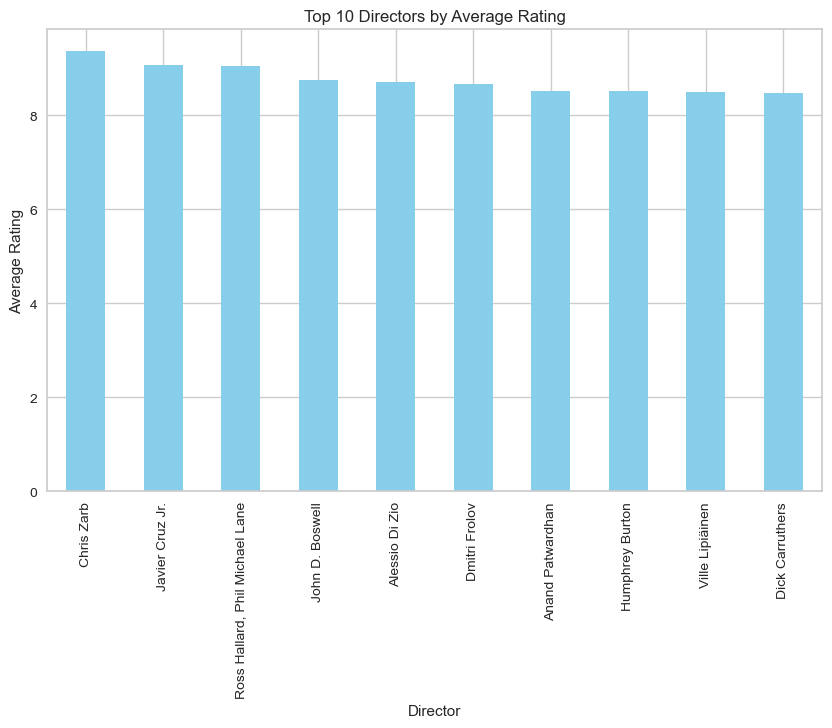

In [32]:
import matplotlib.pyplot as plt

# Top 10 directors by mean rating
top_directors = director_stats.head(10)

# Bar chart
top_directors['mean'].plot(kind='bar', figsize=(10, 6), color='skyblue')
plt.title('Top 10 Directors by Average Rating')
plt.xlabel('Director')
plt.ylabel('Average Rating')
plt.show()

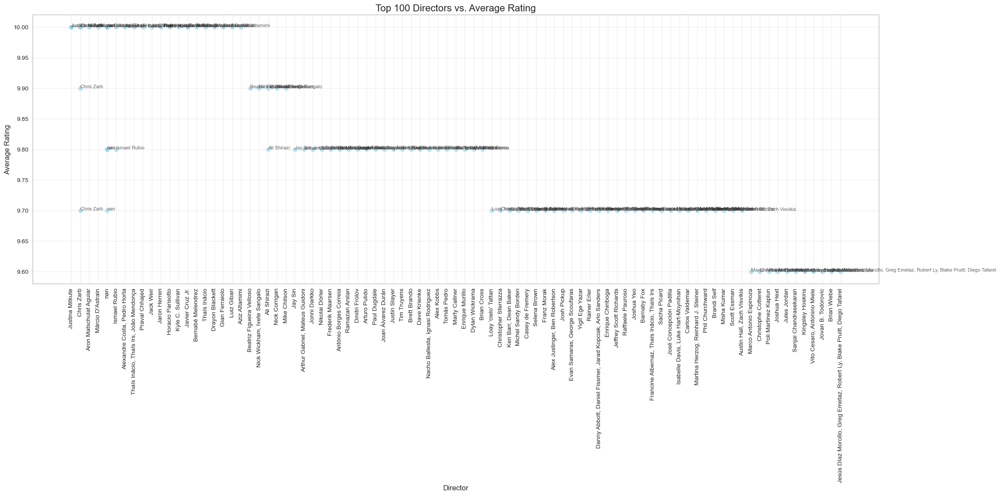

In [34]:
import matplotlib.pyplot as plt

# Sort the data by averageRating and pick the top 100
top_100_directors = data_trimmed[['directors_encoded', 'directors', 'averageRating']].sort_values(by='averageRating', ascending=False).head(100)

# Reset the index to avoid indexing issues
top_100_directors = top_100_directors.reset_index(drop=True)

# Ensure the 'directors' column is treated as strings
top_100_directors['directors'] = top_100_directors['directors'].astype(str)

# Plot
plt.figure(figsize=(25, 8))

# Scatter plot with directors' names
plt.scatter(top_100_directors['directors'], top_100_directors['averageRating'], alpha=0.6, color='skyblue')

# Rotate the labels for better readability
plt.xticks(rotation=90, fontsize=10)

# Add labels for each point
for i in range(len(top_100_directors)):
    plt.text(
        top_100_directors['directors'].iloc[i],  # X-coordinate (director name)
        top_100_directors['averageRating'].iloc[i],     # Y-coordinate (average rating)
        str(top_100_directors['directors'].iloc[i]),    # Director name (ensure it's a string)
        fontsize=8,                        # Adjust label font size
        alpha=0.7                          # Transparency for readability
    )

# Titles and labels
plt.title('Top 100 Directors vs. Average Rating', fontsize=16)
plt.xlabel('Director', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


In [36]:
# Won't generate anything for now since I'm using a trimmed set
# # Filter for directors with more than 5 movies
# top_directors = data_trimmed.groupby('directors').filter(lambda x: len(x) > 5)

# # Use `top_directors` in the scatter plot instead of the full `data`.
# # Ensure 'directors_encoded' and 'averageRating' are in the data
# plt.figure(figsize=(12, 8))

# # Scatter plot
# plt.scatter(top_directors['directors_encoded'], top_directors['averageRating'], alpha=0.6, color='skyblue')

# # Add labels for each point
# for i in range(len(top_directors)):
#     plt.text(
#         top_directors['directors_encoded'].iloc[i],  # X-coordinate (encoded director)
#         top_directors['averageRating'].iloc[i],     # Y-coordinate (average rating)
#         str(data_trimmed['directors'].iloc[i]),    # Director name
#         fontsize=8,                        # Adjust label font size
#         alpha=0.7                          # Transparency for readability
#     )

# # Titles and labels
# plt.title('Directors vs. Average Rating', fontsize=16)
# plt.xlabel('Director (Encoded)', fontsize=12)
# plt.ylabel('Average Rating', fontsize=12)
# plt.grid(alpha=0.3)
# plt.show()


# Lets try to identify which genre combinations dominate in popularity

In [99]:
# One-hot encoding the genres column
# transform the genres column into a one-hot encoded or multi-hot encoded format where each genre becomes a binary column (e.g., "Action", "Comedy", etc.).
data_200k = data[:200000]
genres_encoded = data_200k['genres'].str.get_dummies(sep=',')  # Assuming genres are comma-separated
data = pd.concat([data_200k, genres_encoded], axis=1)

In [101]:
# Combine genres and popularity into a clustering dataset
clustering_data = pd.concat([genres_encoded, data_200k['popularity']], axis=1)

In [103]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Standardize the data to ensure popularity is on the same scale as genre features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust n_clusters as needed
clusters = kmeans.fit_predict(scaled_data)

# Add cluster labels to the dataset
data_200k['genre_cluster'] = clusters

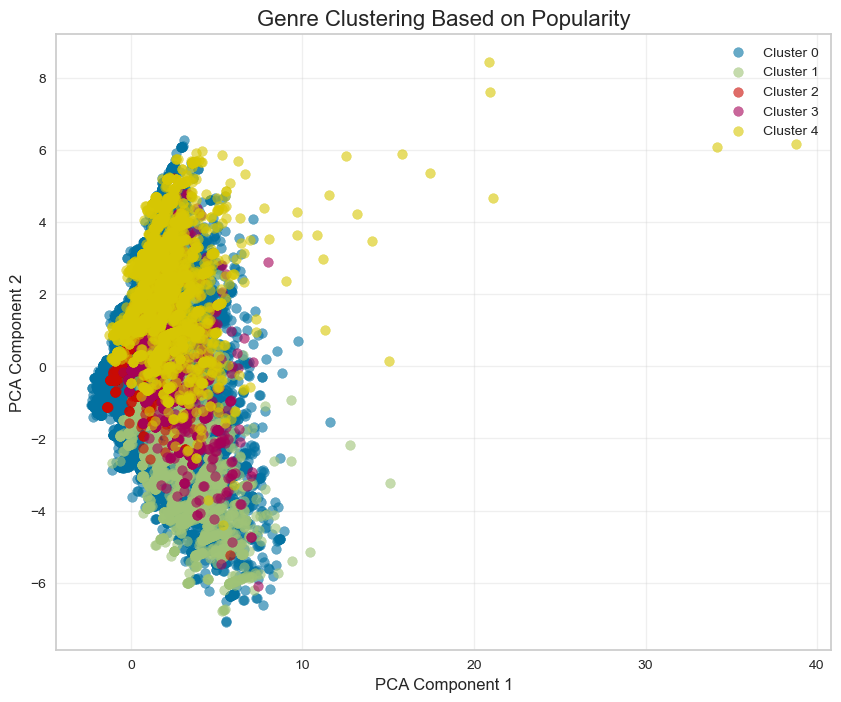

In [105]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)

# Scatter plot of clusters
plt.figure(figsize=(10, 8))
for cluster in set(clusters):
    cluster_points = reduced_data[data_200k['genre_cluster'] == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster}', alpha=0.6)

plt.title('Genre Clustering Based on Popularity', fontsize=16)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.show()


In [107]:
for cluster in sorted(data_200k['genre_cluster'].unique()):
    dominant_genres = data_200k[data_200k['genre_cluster'] == cluster][genres_encoded.columns].mean().sort_values(ascending=False).head(5)
    print(f"Cluster {cluster} - Dominant Genres:\n{dominant_genres}\n")

Cluster 0 - Dominant Genres:
Drama          0.265938
Comedy         0.194796
 Drama         0.132627
Documentary    0.122438
 Romance       0.089965
dtype: float64

Cluster 1 - Dominant Genres:
Animation     0.997491
 Comedy       0.271724
 Family       0.242123
 Fantasy      0.120610
 Adventure    0.099137
dtype: float64

Cluster 2 - Dominant Genres:
History         1.000000
 Drama          0.552978
 Documentary    0.153906
 War            0.126063
 Action         0.073473
dtype: float64

Cluster 3 - Dominant Genres:
Science Fiction    1.000000
 Action            0.207611
 Thriller          0.156643
 Horror            0.155284
 Drama             0.143391
dtype: float64

Cluster 4 - Dominant Genres:
 Crime       0.997875
Action       0.265407
Drama        0.248406
 Thriller    0.245051
 Drama       0.241696
dtype: float64



# Director-Genre Pairs
Columns: directors (encoded), genres (vectorized), and averageRating \
Purpose: Analyze which directors excel in specific genres. \
Insight: Identify directors who consistently perform well in certain genres. \

In [174]:
# Exploding the 'genres' column into multiple rows for each director-genre pair
data = data_200k
genres_expanded = data.assign(genres=data['genres'].str.split(',')).explode('genres')

# Show the expanded dataset
print(genres_expanded.head())

       id         title  vote_average  vote_count    status release_date  \
0   27205     Inception         8.364       34495  Released      7/15/10   
0   27205     Inception         8.364       34495  Released      7/15/10   
0   27205     Inception         8.364       34495  Released      7/15/10   
1  157336  Interstellar         8.417       32571  Released      11/5/14   
1  157336  Interstellar         8.417       32571  Released      11/5/14   

     revenue  runtime  adult                     backdrop_path  ...  Horror  \
0  825532764      148  False  /8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg  ...     0.0   
0  825532764      148  False  /8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg  ...     0.0   
0  825532764      148  False  /8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg  ...     0.0   
1  701729206      169  False  /pbrkL804c8yAv3zBZR4QPEafpAR.jpg  ...     0.0   
1  701729206      169  False  /pbrkL804c8yAv3zBZR4QPEafpAR.jpg  ...     0.0   

  Music Mystery Romance Science Fiction TV Movie  Thriller  War West

In [19]:
# Calculate the average rating for each director-genre pair
director_genre_ratings = genres_expanded.groupby(['directors', 'genres'])['averageRating'].mean().reset_index()

# Display the results
print(director_genre_ratings.head())


              directors   genres  averageRating
0  A. Edward Sutherland      War            6.7
1  A. Edward Sutherland   Comedy            6.7
2            A.B. Stone   Horror            3.2
3            A.B. Stone   Action            3.2
4          A.J. Edwards    Drama            4.8


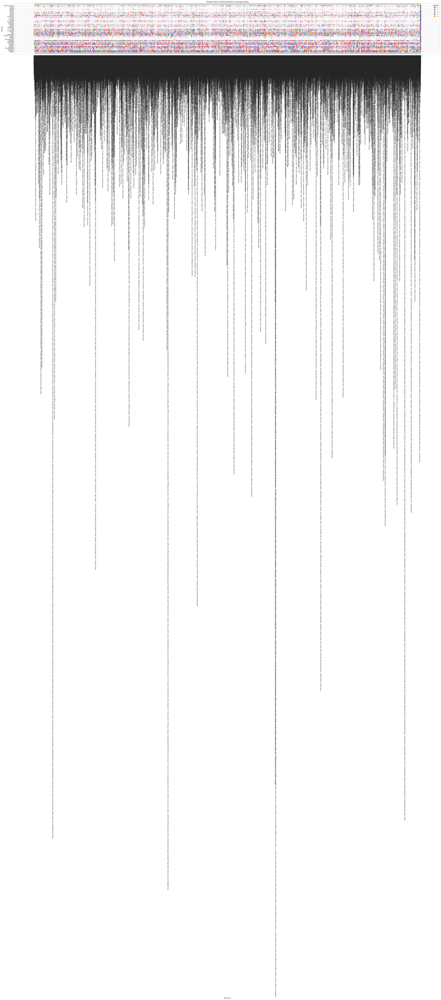

In [178]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Scale the average ratings for clustering
scaler = StandardScaler()
ratings_scaled = scaler.fit_transform(director_genre_ratings[['averageRating']])

# Apply KMeans clustering (e.g., 5 clusters)
kmeans = KMeans(n_clusters=5, random_state=42)
director_genre_ratings['cluster'] = kmeans.fit_predict(ratings_scaled)

# Visualize the clusters
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(50, 6))
sns.scatterplot(data=director_genre_ratings, x='directors', y='genres', hue='cluster', palette='Set1', s=100)
plt.title('Director-Genre Clustering Based on Average Rating')
plt.xlabel('Directors')
plt.ylabel('Genres')
plt.legend(title='Cluster')
plt.xticks(rotation=90)
plt.show()


In [186]:
# Exploding the 'genres' column into multiple rows for each director-genre pair
data = data_200k
genres_expanded = data.assign(genres=data['genres'].str.split(',')).explode('genres')

# Show the expanded dataset
print(genres_expanded.head())

# Count the number of movies per director-genre pair
director_genre_counts = genres_expanded.groupby(['directors', 'genres']).size().reset_index(name='movie_count')

# Filter out director-genre pairs where the director has fewer than 5 movies
directors_with_5_or_more_movies = director_genre_counts[director_genre_counts['movie_count'] >= 5]

# Merge the filtered counts back into the original expanded dataset
filtered_genres_expanded = genres_expanded.merge(directors_with_5_or_more_movies[['directors', 'genres']], on=['directors', 'genres'])

# Calculate the average rating for each director-genre pair
director_genre_ratings = filtered_genres_expanded.groupby(['directors', 'genres'])['averageRating'].mean().reset_index()

# Display the results
print(director_genre_ratings.head())

# Rank director-genre pairs by average rating
director_genre_ratings['rank'] = director_genre_ratings.groupby('genres')['averageRating'].rank(ascending=False)

# Get the top 50 directors for each genre
top_directors_per_genre = director_genre_ratings.groupby('genres').head(50)

# Sort by rank
top_directors_per_genre = top_directors_per_genre.sort_values(by=['genres', 'rank'])

# Print the final results
print(top_directors_per_genre)


       id         title  vote_average  vote_count    status release_date  \
0   27205     Inception         8.364       34495  Released      7/15/10   
0   27205     Inception         8.364       34495  Released      7/15/10   
0   27205     Inception         8.364       34495  Released      7/15/10   
1  157336  Interstellar         8.417       32571  Released      11/5/14   
1  157336  Interstellar         8.417       32571  Released      11/5/14   

     revenue  runtime  adult                     backdrop_path  ...  Horror  \
0  825532764      148  False  /8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg  ...     0.0   
0  825532764      148  False  /8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg  ...     0.0   
0  825532764      148  False  /8ZTVqvKDQ8emSGUEMjsS4yHAwrp.jpg  ...     0.0   
1  701729206      169  False  /pbrkL804c8yAv3zBZR4QPEafpAR.jpg  ...     0.0   
1  701729206      169  False  /pbrkL804c8yAv3zBZR4QPEafpAR.jpg  ...     0.0   

  Music Mystery Romance Science Fiction TV Movie  Thriller  War West

In [200]:
# Calculate the average rating for each director-genre pair
director_genre_ratings = filtered_genres_expanded.groupby(['directors', 'genres'])['averageRating'].mean().reset_index()

# Rank director-genre pairs by average rating within each genre
director_genre_ratings['rank'] = director_genre_ratings.groupby('genres')['averageRating'].rank(ascending=False, method='first')

# Get the top 5 directors for each genre based on the rank
top_5_directors_per_genre = director_genre_ratings[director_genre_ratings['rank'] <= 5]

# Sort by genre and rank to maintain order
top_5_directors_per_genre = top_5_directors_per_genre.sort_values(by=['genres', 'rank'])

# Print the final results
print(top_5_directors_per_genre)

                directors   genres  averageRating  rank
6045        Peter Jackson   Action       8.250000   1.0
1219          Chuck Jones   Action       8.066667   2.0
7017       S.S. Rajamouli   Action       7.480000   3.0
3410            Jay Oliva   Action       7.471429   4.0
7535     Steven Spielberg   Action       7.400000   5.0
...                   ...      ...            ...   ...
6801  Rogelio A. González  Western       7.360000   1.0
490          Anthony Mann  Western       7.125000   2.0
7061        Sam Peckinpah  Western       7.042857   3.0
3753            John Ford  Western       6.894444   4.0
1705         Delmer Daves  Western       6.850000   5.0

[190 rows x 4 columns]


In [202]:
display(top_5_directors_per_genre)
print(len(top_5_directors_per_genre.index))

,directors,genres,averageRating,rank
6045,Peter Jackson,Action,8.250000,1.0
1219,Chuck Jones,Action,8.066667,2.0
7017,S.S. Rajamouli,Action,7.480000,3.0
3410,Jay Oliva,Action,7.471429,4.0
7535,Steven Spielberg,Action,7.400000,5.0
...,...,...,...,...
6801,Rogelio A. González,Western,7.360000,1.0
490,Anthony Mann,Western,7.125000,2.0
7061,Sam Peckinpah,Western,7.042857,3.0
3753,John Ford,Western,6.894444,4.0


190


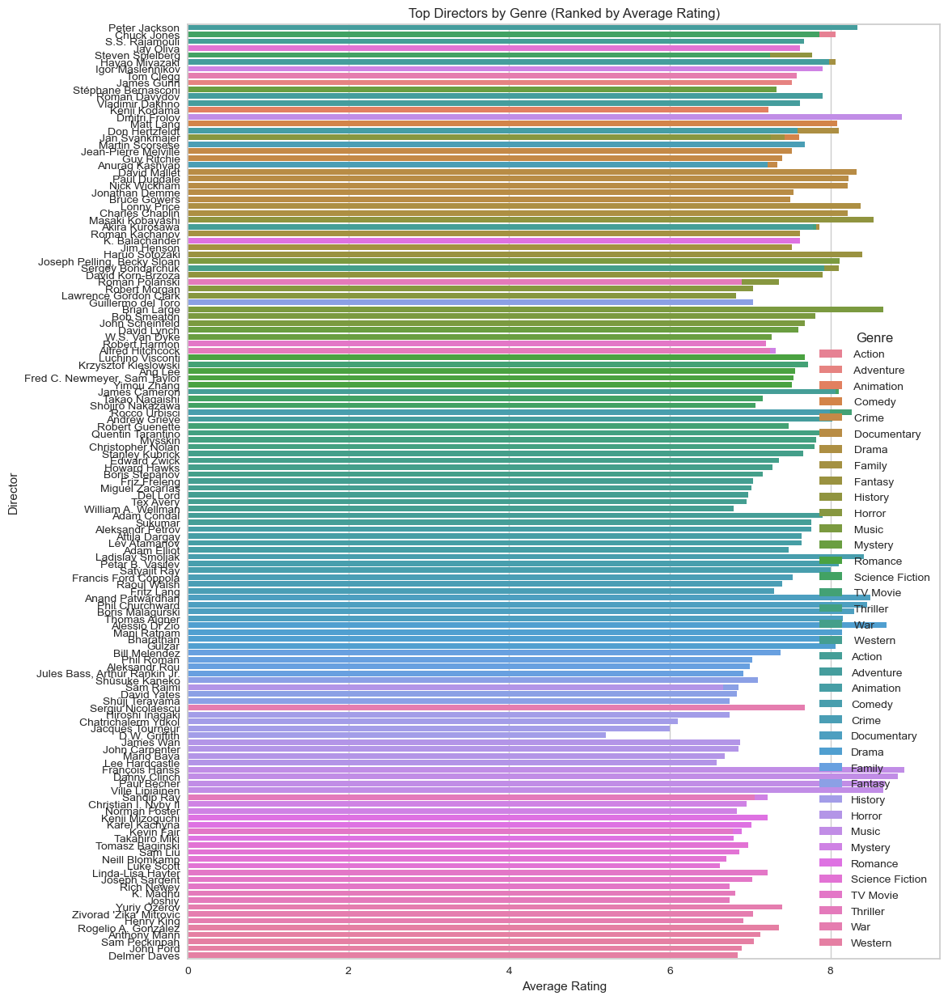

In [204]:
top_5_directors_per_genre['genres'] = top_5_directors_per_genre['genres'].astype(str)

plt.figure(figsize=(12, 15))
sns.barplot(data=top_5_directors_per_genre, x='averageRating', y='directors', hue='genres', dodge=False)
plt.title('Top Directors by Genre (Ranked by Average Rating)')
plt.xlabel('Average Rating')
plt.ylabel('Director')
plt.legend(title='Genre')
plt.show()

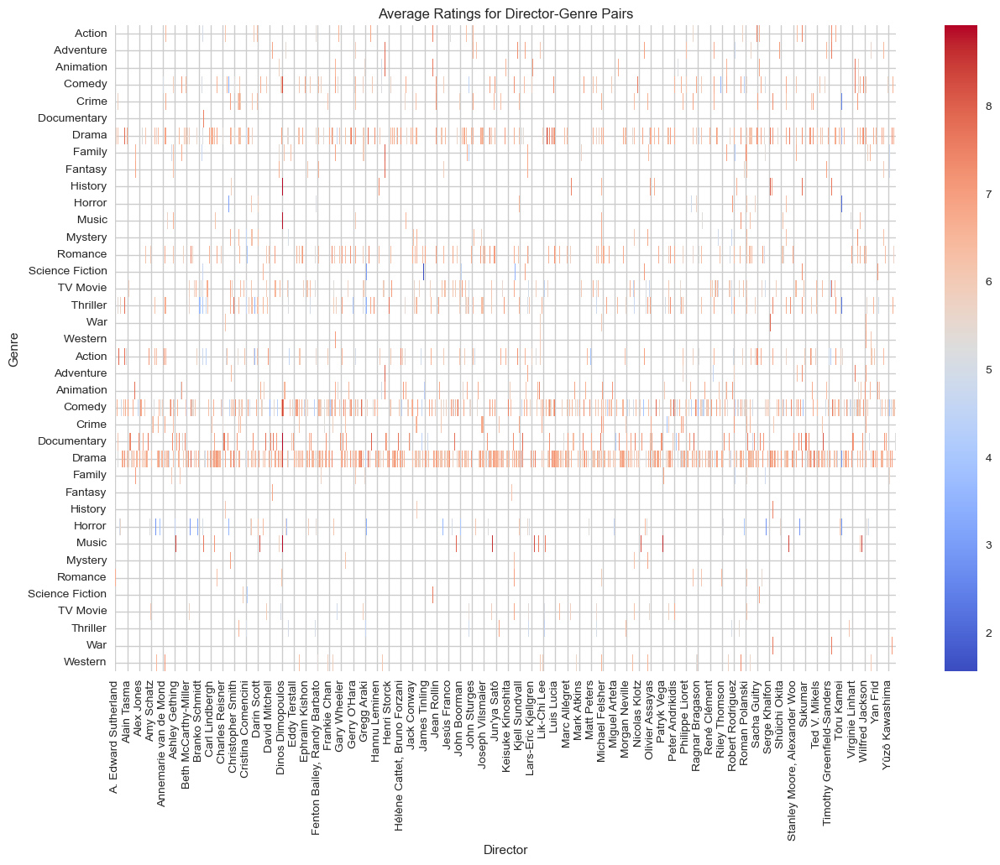

In [206]:
# Pivot the data for a heatmap
heatmap_data = director_genre_ratings.pivot(index='genres', columns='directors', values='averageRating')

# Plot the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=False, cbar=True)
plt.title('Average Ratings for Director-Genre Pairs')
plt.xlabel('Director')
plt.ylabel('Genre')
plt.show()


In [210]:
# Get the best (top-ranked) director for each genre
best_director_per_genre = top_5_directors_per_genre[top_5_directors_per_genre['rank'] == 1]

# Display the results
print(best_director_per_genre[['genres', 'directors', 'averageRating']])

                genres            directors  averageRating
6045            Action        Peter Jackson       8.250000
2882         Adventure       Hayao Miyazaki       7.833333
2883         Animation       Hayao Miyazaki       7.930000
1775            Comedy        Dmitri Frolov       8.320000
3093             Crime     Igor Maslennikov       7.900000
1637       Documentary         David Mallet       8.325000
4708             Drama          Lonny Price       8.380000
2884            Family       Hayao Miyazaki       8.066667
2869           Fantasy       Haruo Sotozaki       8.400000
1776           History        Dmitri Frolov       8.883333
6861            Horror       Roman Polanski       7.360000
1777             Music        Dmitri Frolov       8.812500
1626           Mystery          David Lynch       7.600000
4755           Romance     Luchino Visconti       7.680000
3299   Science Fiction        James Cameron       8.100000
6770          TV Movie        Rocco Urbisci       8.2666

In [ ]:
# Most successful Studios

In [215]:
# Assuming the relevant columns are: 'production_companies', 'revenue', 'budget', 'averageRating'

# Split 'production_companies' and explode it to create one row per studio
data_200k['production_companies'] = data_200k['production_companies'].str.split(',')  # Split by comma
exploded_data = data_200k.explode('production_companies')  # Create separate rows for each studio

# Replace NaN values with 0 for financial metrics
exploded_data['revenue'].fillna(0, inplace=True)
exploded_data['budget'].fillna(0, inplace=True)

# Group by production company (studio) and aggregate the data
studio_success = exploded_data.groupby('production_companies').agg(
    total_revenue=('revenue', 'sum'),
    total_budget=('budget', 'sum'),
    avg_popularity=('averageRating', 'mean'),
    num_movies=('revenue', 'count')  # To see how many movies each studio has made
).reset_index()

# Sort by total revenue and popularity
studio_success_sorted_by_revenue = studio_success.sort_values(by='total_revenue', ascending=False)
studio_success_sorted_by_popularity = studio_success.sort_values(by='avg_popularity', ascending=False)

# Display the results
print("Top Studios by Financial Success (Revenue):")
print(studio_success_sorted_by_revenue.head(10))

print("\nTop Studios by Popularity (Average Rating):")
print(studio_success_sorted_by_popularity.head(10))


Top Studios by Financial Success (Revenue):
         production_companies  total_revenue  total_budget  avg_popularity  \
40212   Warner Bros. Pictures    54926053883   23914770929        6.281643   
151          20th Century Fox    53985811939   16336699202        6.223480   
38980      Universal Pictures    42455044188   12831911552        6.294106   
87003    Walt Disney Pictures    36858047117   12398776453        6.354412   
73527               Paramount    35562052683   11487002179        6.362179   
85710      Universal Pictures    34873484494   11295750923        6.335895   
8300        Columbia Pictures    34015492127   12259757073        6.256007   
68615          Marvel Studios    29536338738    6399000000        7.176190   
27983               Paramount    27853506953   10214959562        6.313369   
51636       Columbia Pictures    25938618843    9213352678        6.419017   

       num_movies  
40212         986  
151           592  
38980         526  
87003         272

/var/folders/tr/sh799zpx75ggxq0xkwpr3c8w0000gn/T/ipykernel_49720/129463193.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  exploded_data['revenue'].fillna(0, inplace=True)
/var/folders/tr/sh799zpx75ggxq0xkwpr3c8w0000gn/T/ipykernel_49720/129463193.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always

/var/folders/tr/sh799zpx75ggxq0xkwpr3c8w0000gn/T/ipykernel_55748/1211923930.py:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data_200k['release_year'] = pd.to_datetime(data_200k['release_date'], errors='coerce').dt.year
/var/folders/tr/sh799zpx75ggxq0xkwpr3c8w0000gn/T/ipykernel_55748/1211923930.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_200k['release_year'] = pd.to_datetime(data_200k['release_date'], errors='coerce').dt.year
/var/folders/tr/sh799zpx75ggxq0xkwpr3c8w0000gn/T/ipykernel_55748/1211923930.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

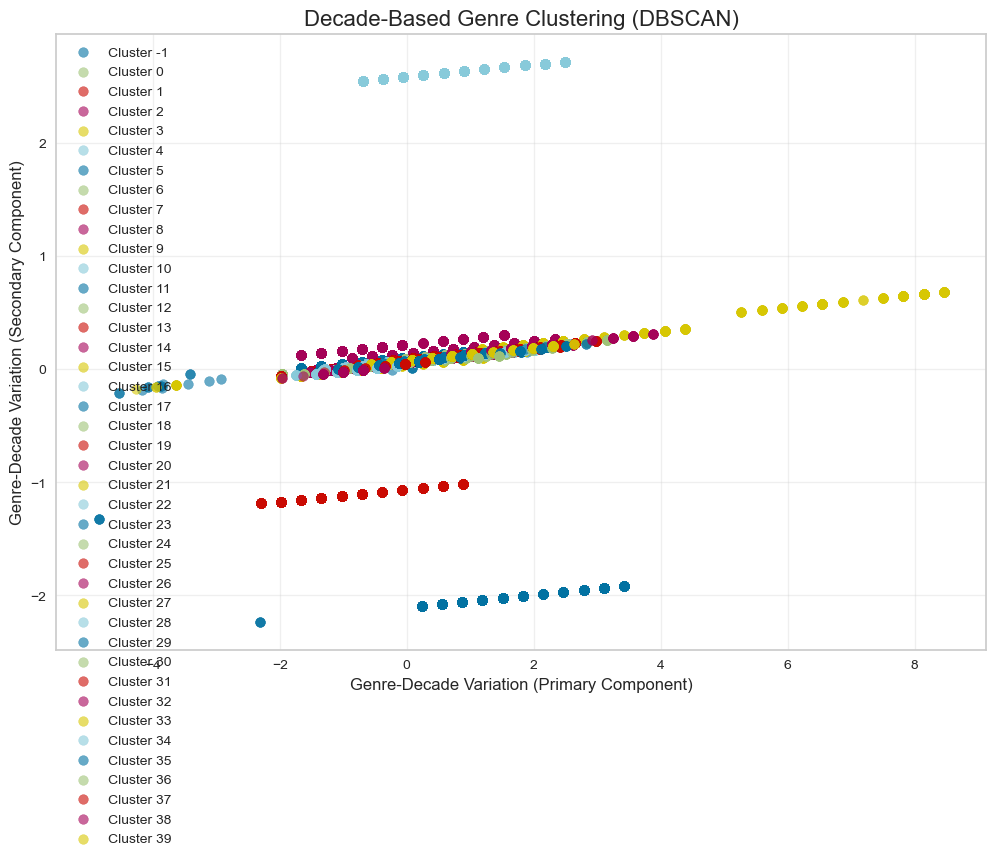

In [13]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


data_200k = data[:20000]

# Step 1: Bin release years into decades
data_200k['release_year'] = pd.to_datetime(data_200k['release_date'], errors='coerce').dt.year
data_200k['decade'] = (data_200k['release_year'] // 10 * 10).astype('Int64')

# Step 2: Explode the genres column
genres_expanded = data_200k.assign(genres=data_200k['genres'].str.split(',')).explode('genres')

# Step 3: One-hot encode genres
genres_encoded = genres_expanded['genres'].str.get_dummies()

# Step 4: Combine one-hot encoded genres and decade
clustering_data = pd.concat([genres_encoded, genres_expanded['decade']], axis=1)

# Step 5: Standardize the data for clustering
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data.dropna())

# Step 6: Use DBSCAN for clustering
dbscan = DBSCAN(eps=2, min_samples=5)
clusters = dbscan.fit_predict(scaled_data)

# Add clusters back to the data
genres_expanded['genre_decade_cluster'] = clusters

# Step 7: Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_data)

# Step 8: Visualize the clusters
plt.figure(figsize=(12, 8))
unique_clusters = np.unique(clusters)
for cluster in unique_clusters:
    cluster_points = reduced_data[clusters == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster}', alpha=0.6)

plt.title('Decade-Based Genre Clustering (DBSCAN)', fontsize=16)
plt.xlabel('Genre-Decade Variation (Primary Component)', fontsize=12)
plt.ylabel('Genre-Decade Variation (Secondary Component)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.show()


    Cluster                Top Genres  Median Decade  Avg Rating  \
0        -1  [Comedy, Drama, Fantasy]         1890.0    6.644444   
1         0                  [Action]         2010.0    6.033013   
2         1        [ Science Fiction]         2010.0    6.016070   
3         2              [ Adventure]         2010.0    6.215723   
4         3               [Adventure]         2000.0    6.432515   
5         4                  [ Drama]         2010.0    6.630555   
6         5                   [Drama]         2010.0    6.837954   
7         6                 [ Action]         2010.0    6.215562   
8         7                  [ Crime]         2010.0    6.444314   
9         8               [ Thriller]         2010.0    6.128662   
10        9                [ Fantasy]         2010.0    6.292960   
11       10         [Science Fiction]         2010.0    6.066034   
12       11                 [ Comedy]         2010.0    6.301348   
13       12                [Thriller]         20

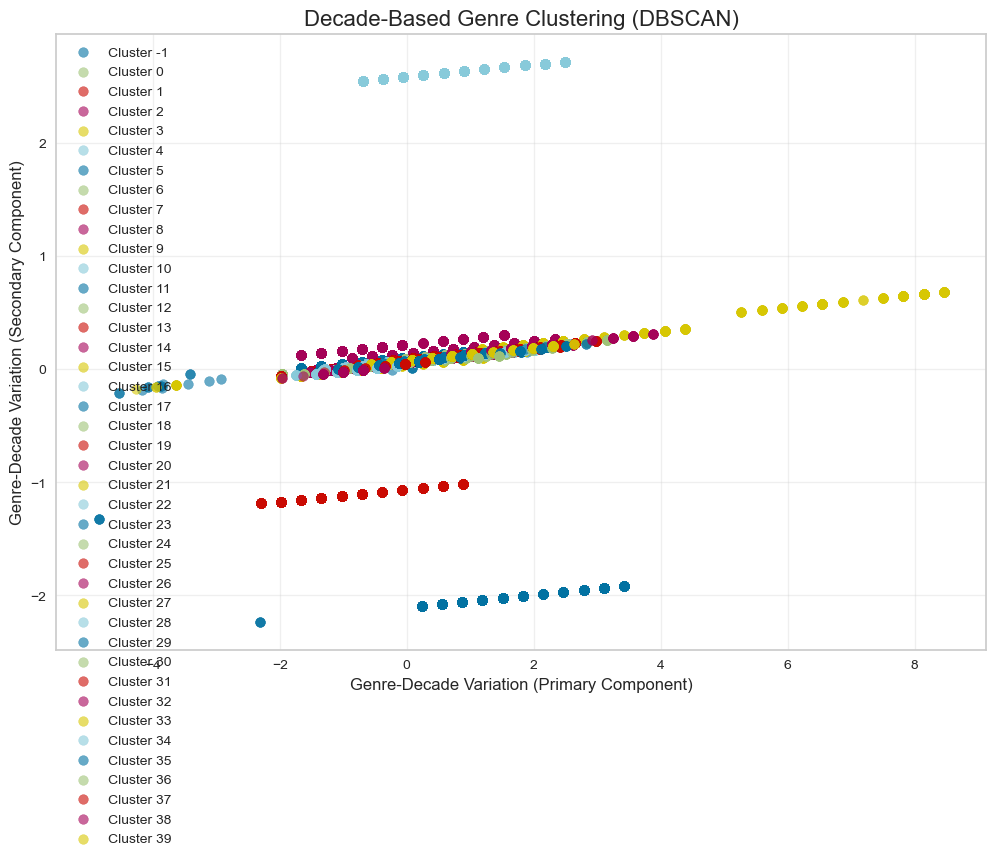

In [15]:
# Step 1: Add cluster labels to the original data
genres_expanded['genre_decade_cluster'] = clusters

# Step 2: Summarize each cluster
# Aggregate data to understand the characteristics of each cluster
cluster_summary = genres_expanded.groupby('genre_decade_cluster').agg({
    'genres': lambda x: x.value_counts().head(3).index.tolist(),  # Top 3 genres in the cluster
    'decade': 'median',  # Median decade
    'averageRating': 'mean',  # Average rating
    'popularity': 'mean',  # Average popularity (replace with relevant column if needed)
}).reset_index()

# Rename columns for clarity
cluster_summary.columns = ['Cluster', 'Top Genres', 'Median Decade', 'Avg Rating', 'Avg Popularity']

# Step 3: Display cluster characteristics
print(cluster_summary)

# Step 4: Visualize clusters again for context
plt.figure(figsize=(12, 8))
for cluster in unique_clusters:
    cluster_points = reduced_data[clusters == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster}', alpha=0.6)

plt.title('Decade-Based Genre Clustering (DBSCAN)', fontsize=16)
plt.xlabel('Genre-Decade Variation (Primary Component)', fontsize=12)
plt.ylabel('Genre-Decade Variation (Secondary Component)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.show()
